In [1]:
import numpy as np
import pandas as pd
import os
import math
import random 
import cv2 as cv

from scipy import stats #Analysis 
from scipy.stats import norm 

import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline

1. Data Load
치매 예방을 위한 라이프로그 치매 분류

9,327 rows × 2 columns x 5 picture

For more details https://aihub.or.kr/problem_contest/nipa-learning-platform/6

In [2]:
# original data : data 

path = "./Dataset/pic_dataset"

FAST_RUN = False
IMAGE_WIDTH=34
IMAGE_HEIGHT=34
IMAGE_SIZE=(IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_CHANNELS=1

filenames = os.listdir(path)
categories = []
sobee = []

# data = cv.imread('/content/gdrive/My Drive/CoLab/Dataset/pic_dataset/CN_0.png', 0)
# img = cv.resize(data, None, fx=28/349, fy=28/231)
# print(img/255)
# print(img.shape)

for filename in filenames:
    category = filename.split('_')[0]
    categories.append(category)
#    if category == 'CN':
#        categories.append(0)
#    elif  category == 'MCI':
#        categories.append(1)
#    else:
#        categories.append(2)

data = pd.DataFrame({
    'filename': filenames,
    'category': categories
})

data

,filename,category
0,CN_0.png,CN
1,CN_1.png,CN
2,CN_10.png,CN
3,CN_1000.png,CN
4,CN_1001.png,CN
...,...,...
9322,MCI_95.png,MCI
9323,MCI_96.png,MCI
9324,MCI_97.png,MCI
9325,MCI_98.png,MCI


2. EDA
9,327 rows × 66 columns

148명에 대한 데일리 라이프로그 데이터
크게 1. 기본 정보 2. 걸음거리 3.수면 4.컨버팅 데이터로 나눌 수 있겠습니다.

4. converting

CONVERT(activity_class_5min USING utf8)
CONVERT(activity_met_1min USING utf8)
CONVERT(sleep_hr_5min USING utf8)
CONVERT(sleep_hypnogram_5min USING utf8)
CONVERT(sleep_rmssd_5min USING utf8)
y variable

DIAG_NM
정상(CN), 경도인지 장애(MCI), 치매(Dem)

In [3]:
data.shape

(9327, 2)

In [5]:
for i in range(len(filenames)):
  mypath = path + '/' + filenames[i]
  print(mypath)
  data = cv.imread(mypath, 0)
  img = cv.resize(data, None, fx=28/349, fy=28/231)
  img = img/255
  sobee.append(img)

./Dataset/pic_dataset/CN_0.png
./Dataset/pic_dataset/CN_1.png
./Dataset/pic_dataset/CN_10.png
./Dataset/pic_dataset/CN_1000.png
./Dataset/pic_dataset/CN_1001.png
./Dataset/pic_dataset/CN_1002.png
./Dataset/pic_dataset/CN_1003.png
./Dataset/pic_dataset/CN_1004.png
./Dataset/pic_dataset/CN_1005.png
./Dataset/pic_dataset/CN_1006.png
./Dataset/pic_dataset/CN_1007.png
./Dataset/pic_dataset/CN_1008.png
./Dataset/pic_dataset/CN_1009.png
./Dataset/pic_dataset/CN_1010.png
./Dataset/pic_dataset/CN_1011.png
./Dataset/pic_dataset/CN_1012.png
./Dataset/pic_dataset/CN_1013.png
./Dataset/pic_dataset/CN_1014.png
./Dataset/pic_dataset/CN_1015.png
./Dataset/pic_dataset/CN_1016.png
./Dataset/pic_dataset/CN_1017.png
./Dataset/pic_dataset/CN_1018.png
./Dataset/pic_dataset/CN_1019.png
./Dataset/pic_dataset/CN_1020.png
./Dataset/pic_dataset/CN_1021.png
./Dataset/pic_dataset/CN_1022.png
./Dataset/pic_dataset/CN_1023.png
./Dataset/pic_dataset/CN_1024.png
./Dataset/pic_dataset/CN_1025.png
./Dataset/pic_dataset/

./Dataset/pic_dataset/CN_1735.png
./Dataset/pic_dataset/CN_1736.png
./Dataset/pic_dataset/CN_1737.png
./Dataset/pic_dataset/CN_1738.png
./Dataset/pic_dataset/CN_1739.png
./Dataset/pic_dataset/CN_174.png
./Dataset/pic_dataset/CN_1740.png
./Dataset/pic_dataset/CN_1741.png
./Dataset/pic_dataset/CN_1742.png
./Dataset/pic_dataset/CN_1743.png
./Dataset/pic_dataset/CN_1744.png
./Dataset/pic_dataset/CN_1745.png
./Dataset/pic_dataset/CN_175.png
./Dataset/pic_dataset/CN_176.png
./Dataset/pic_dataset/CN_177.png
./Dataset/pic_dataset/CN_178.png
./Dataset/pic_dataset/CN_179.png
./Dataset/pic_dataset/CN_18.png
./Dataset/pic_dataset/CN_180.png
./Dataset/pic_dataset/CN_181.png
./Dataset/pic_dataset/CN_1811.png
./Dataset/pic_dataset/CN_1812.png
./Dataset/pic_dataset/CN_1813.png
./Dataset/pic_dataset/CN_1814.png
./Dataset/pic_dataset/CN_1815.png
./Dataset/pic_dataset/CN_1816.png
./Dataset/pic_dataset/CN_1817.png
./Dataset/pic_dataset/CN_1818.png
./Dataset/pic_dataset/CN_1819.png
./Dataset/pic_dataset/CN

./Dataset/pic_dataset/CN_2309.png
./Dataset/pic_dataset/CN_2310.png
./Dataset/pic_dataset/CN_2311.png
./Dataset/pic_dataset/CN_2312.png
./Dataset/pic_dataset/CN_2313.png
./Dataset/pic_dataset/CN_2314.png
./Dataset/pic_dataset/CN_2315.png
./Dataset/pic_dataset/CN_2316.png
./Dataset/pic_dataset/CN_2317.png
./Dataset/pic_dataset/CN_2318.png
./Dataset/pic_dataset/CN_2319.png
./Dataset/pic_dataset/CN_2320.png
./Dataset/pic_dataset/CN_2321.png
./Dataset/pic_dataset/CN_2322.png
./Dataset/pic_dataset/CN_2323.png
./Dataset/pic_dataset/CN_2324.png
./Dataset/pic_dataset/CN_2325.png
./Dataset/pic_dataset/CN_2326.png
./Dataset/pic_dataset/CN_2327.png
./Dataset/pic_dataset/CN_2328.png
./Dataset/pic_dataset/CN_2329.png
./Dataset/pic_dataset/CN_2330.png
./Dataset/pic_dataset/CN_2331.png
./Dataset/pic_dataset/CN_2332.png
./Dataset/pic_dataset/CN_2333.png
./Dataset/pic_dataset/CN_2334.png
./Dataset/pic_dataset/CN_2335.png
./Dataset/pic_dataset/CN_2336.png
./Dataset/pic_dataset/CN_2337.png
./Dataset/pic_

./Dataset/pic_dataset/CN_2673.png
./Dataset/pic_dataset/CN_2674.png
./Dataset/pic_dataset/CN_2675.png
./Dataset/pic_dataset/CN_2676.png
./Dataset/pic_dataset/CN_2677.png
./Dataset/pic_dataset/CN_2678.png
./Dataset/pic_dataset/CN_2679.png
./Dataset/pic_dataset/CN_268.png
./Dataset/pic_dataset/CN_2680.png
./Dataset/pic_dataset/CN_2681.png
./Dataset/pic_dataset/CN_2682.png
./Dataset/pic_dataset/CN_2683.png
./Dataset/pic_dataset/CN_2684.png
./Dataset/pic_dataset/CN_2685.png
./Dataset/pic_dataset/CN_2686.png
./Dataset/pic_dataset/CN_2687.png
./Dataset/pic_dataset/CN_2688.png
./Dataset/pic_dataset/CN_2689.png
./Dataset/pic_dataset/CN_269.png
./Dataset/pic_dataset/CN_2690.png
./Dataset/pic_dataset/CN_2691.png
./Dataset/pic_dataset/CN_2692.png
./Dataset/pic_dataset/CN_2693.png
./Dataset/pic_dataset/CN_2694.png
./Dataset/pic_dataset/CN_2695.png
./Dataset/pic_dataset/CN_2696.png
./Dataset/pic_dataset/CN_2697.png
./Dataset/pic_dataset/CN_2698.png
./Dataset/pic_dataset/CN_2699.png
./Dataset/pic_da

./Dataset/pic_dataset/CN_3002.png
./Dataset/pic_dataset/CN_3003.png
./Dataset/pic_dataset/CN_3004.png
./Dataset/pic_dataset/CN_3005.png
./Dataset/pic_dataset/CN_3006.png
./Dataset/pic_dataset/CN_3007.png
./Dataset/pic_dataset/CN_3008.png
./Dataset/pic_dataset/CN_3009.png
./Dataset/pic_dataset/CN_301.png
./Dataset/pic_dataset/CN_3010.png
./Dataset/pic_dataset/CN_3011.png
./Dataset/pic_dataset/CN_3012.png
./Dataset/pic_dataset/CN_3013.png
./Dataset/pic_dataset/CN_3014.png
./Dataset/pic_dataset/CN_3015.png
./Dataset/pic_dataset/CN_3016.png
./Dataset/pic_dataset/CN_3017.png
./Dataset/pic_dataset/CN_3018.png
./Dataset/pic_dataset/CN_3019.png
./Dataset/pic_dataset/CN_302.png
./Dataset/pic_dataset/CN_3020.png
./Dataset/pic_dataset/CN_3021.png
./Dataset/pic_dataset/CN_3022.png
./Dataset/pic_dataset/CN_3023.png
./Dataset/pic_dataset/CN_3024.png
./Dataset/pic_dataset/CN_3025.png
./Dataset/pic_dataset/CN_3026.png
./Dataset/pic_dataset/CN_303.png
./Dataset/pic_dataset/CN_304.png
./Dataset/pic_data

./Dataset/pic_dataset/CN_3572.png
./Dataset/pic_dataset/CN_3573.png
./Dataset/pic_dataset/CN_3574.png
./Dataset/pic_dataset/CN_3575.png
./Dataset/pic_dataset/CN_3576.png
./Dataset/pic_dataset/CN_3577.png
./Dataset/pic_dataset/CN_3578.png
./Dataset/pic_dataset/CN_3579.png
./Dataset/pic_dataset/CN_3580.png
./Dataset/pic_dataset/CN_3581.png
./Dataset/pic_dataset/CN_3582.png
./Dataset/pic_dataset/CN_3583.png
./Dataset/pic_dataset/CN_3584.png
./Dataset/pic_dataset/CN_3585.png
./Dataset/pic_dataset/CN_3586.png
./Dataset/pic_dataset/CN_3587.png
./Dataset/pic_dataset/CN_3588.png
./Dataset/pic_dataset/CN_3589.png
./Dataset/pic_dataset/CN_3590.png
./Dataset/pic_dataset/CN_3591.png
./Dataset/pic_dataset/CN_3592.png
./Dataset/pic_dataset/CN_3593.png
./Dataset/pic_dataset/CN_3594.png
./Dataset/pic_dataset/CN_3595.png
./Dataset/pic_dataset/CN_3596.png
./Dataset/pic_dataset/CN_3597.png
./Dataset/pic_dataset/CN_3598.png
./Dataset/pic_dataset/CN_3599.png
./Dataset/pic_dataset/CN_36.png
./Dataset/pic_da

./Dataset/pic_dataset/CN_4042.png
./Dataset/pic_dataset/CN_4043.png
./Dataset/pic_dataset/CN_4044.png
./Dataset/pic_dataset/CN_4045.png
./Dataset/pic_dataset/CN_4046.png
./Dataset/pic_dataset/CN_4047.png
./Dataset/pic_dataset/CN_4048.png
./Dataset/pic_dataset/CN_4049.png
./Dataset/pic_dataset/CN_405.png
./Dataset/pic_dataset/CN_406.png
./Dataset/pic_dataset/CN_407.png
./Dataset/pic_dataset/CN_408.png
./Dataset/pic_dataset/CN_409.png
./Dataset/pic_dataset/CN_41.png
./Dataset/pic_dataset/CN_410.png
./Dataset/pic_dataset/CN_411.png
./Dataset/pic_dataset/CN_4115.png
./Dataset/pic_dataset/CN_4116.png
./Dataset/pic_dataset/CN_4117.png
./Dataset/pic_dataset/CN_4118.png
./Dataset/pic_dataset/CN_4119.png
./Dataset/pic_dataset/CN_412.png
./Dataset/pic_dataset/CN_4120.png
./Dataset/pic_dataset/CN_4121.png
./Dataset/pic_dataset/CN_4122.png
./Dataset/pic_dataset/CN_4123.png
./Dataset/pic_dataset/CN_4124.png
./Dataset/pic_dataset/CN_4125.png
./Dataset/pic_dataset/CN_4126.png
./Dataset/pic_dataset/CN

./Dataset/pic_dataset/CN_4521.png
./Dataset/pic_dataset/CN_4522.png
./Dataset/pic_dataset/CN_4523.png
./Dataset/pic_dataset/CN_4524.png
./Dataset/pic_dataset/CN_4525.png
./Dataset/pic_dataset/CN_4526.png
./Dataset/pic_dataset/CN_4527.png
./Dataset/pic_dataset/CN_4528.png
./Dataset/pic_dataset/CN_4529.png
./Dataset/pic_dataset/CN_4530.png
./Dataset/pic_dataset/CN_4531.png
./Dataset/pic_dataset/CN_4532.png
./Dataset/pic_dataset/CN_4533.png
./Dataset/pic_dataset/CN_4534.png
./Dataset/pic_dataset/CN_4535.png
./Dataset/pic_dataset/CN_4536.png
./Dataset/pic_dataset/CN_4537.png
./Dataset/pic_dataset/CN_4538.png
./Dataset/pic_dataset/CN_4539.png
./Dataset/pic_dataset/CN_4540.png
./Dataset/pic_dataset/CN_4541.png
./Dataset/pic_dataset/CN_4542.png
./Dataset/pic_dataset/CN_4543.png
./Dataset/pic_dataset/CN_4544.png
./Dataset/pic_dataset/CN_4545.png
./Dataset/pic_dataset/CN_4546.png
./Dataset/pic_dataset/CN_4547.png
./Dataset/pic_dataset/CN_4548.png
./Dataset/pic_dataset/CN_4549.png
./Dataset/pic_

./Dataset/pic_dataset/CN_5107.png
./Dataset/pic_dataset/CN_5108.png
./Dataset/pic_dataset/CN_5109.png
./Dataset/pic_dataset/CN_5110.png
./Dataset/pic_dataset/CN_5111.png
./Dataset/pic_dataset/CN_5112.png
./Dataset/pic_dataset/CN_5113.png
./Dataset/pic_dataset/CN_5114.png
./Dataset/pic_dataset/CN_5115.png
./Dataset/pic_dataset/CN_5116.png
./Dataset/pic_dataset/CN_5117.png
./Dataset/pic_dataset/CN_5118.png
./Dataset/pic_dataset/CN_5119.png
./Dataset/pic_dataset/CN_5120.png
./Dataset/pic_dataset/CN_5121.png
./Dataset/pic_dataset/CN_5122.png
./Dataset/pic_dataset/CN_5123.png
./Dataset/pic_dataset/CN_5124.png
./Dataset/pic_dataset/CN_5125.png
./Dataset/pic_dataset/CN_5126.png
./Dataset/pic_dataset/CN_5127.png
./Dataset/pic_dataset/CN_5128.png
./Dataset/pic_dataset/CN_5129.png
./Dataset/pic_dataset/CN_5130.png
./Dataset/pic_dataset/CN_5131.png
./Dataset/pic_dataset/CN_5132.png
./Dataset/pic_dataset/CN_5133.png
./Dataset/pic_dataset/CN_5134.png
./Dataset/pic_dataset/CN_5135.png
./Dataset/pic_

./Dataset/pic_dataset/CN_565.png
./Dataset/pic_dataset/CN_5650.png
./Dataset/pic_dataset/CN_5651.png
./Dataset/pic_dataset/CN_5652.png
./Dataset/pic_dataset/CN_5653.png
./Dataset/pic_dataset/CN_5654.png
./Dataset/pic_dataset/CN_5655.png
./Dataset/pic_dataset/CN_5656.png
./Dataset/pic_dataset/CN_5657.png
./Dataset/pic_dataset/CN_5658.png
./Dataset/pic_dataset/CN_5659.png
./Dataset/pic_dataset/CN_566.png
./Dataset/pic_dataset/CN_5660.png
./Dataset/pic_dataset/CN_5661.png
./Dataset/pic_dataset/CN_5662.png
./Dataset/pic_dataset/CN_5663.png
./Dataset/pic_dataset/CN_5664.png
./Dataset/pic_dataset/CN_5665.png
./Dataset/pic_dataset/CN_5666.png
./Dataset/pic_dataset/CN_5667.png
./Dataset/pic_dataset/CN_5668.png
./Dataset/pic_dataset/CN_5669.png
./Dataset/pic_dataset/CN_567.png
./Dataset/pic_dataset/CN_5670.png
./Dataset/pic_dataset/CN_5671.png
./Dataset/pic_dataset/CN_5672.png
./Dataset/pic_dataset/CN_5673.png
./Dataset/pic_dataset/CN_5674.png
./Dataset/pic_dataset/CN_5675.png
./Dataset/pic_dat

./Dataset/pic_dataset/CN_6230.png
./Dataset/pic_dataset/CN_6231.png
./Dataset/pic_dataset/CN_6232.png
./Dataset/pic_dataset/CN_6233.png
./Dataset/pic_dataset/CN_6234.png
./Dataset/pic_dataset/CN_6235.png
./Dataset/pic_dataset/CN_6236.png
./Dataset/pic_dataset/CN_6237.png
./Dataset/pic_dataset/CN_6238.png
./Dataset/pic_dataset/CN_6239.png
./Dataset/pic_dataset/CN_624.png
./Dataset/pic_dataset/CN_6240.png
./Dataset/pic_dataset/CN_6241.png
./Dataset/pic_dataset/CN_6242.png
./Dataset/pic_dataset/CN_6243.png
./Dataset/pic_dataset/CN_6244.png
./Dataset/pic_dataset/CN_6245.png
./Dataset/pic_dataset/CN_6246.png
./Dataset/pic_dataset/CN_6247.png
./Dataset/pic_dataset/CN_6248.png
./Dataset/pic_dataset/CN_6249.png
./Dataset/pic_dataset/CN_625.png
./Dataset/pic_dataset/CN_6250.png
./Dataset/pic_dataset/CN_6251.png
./Dataset/pic_dataset/CN_6252.png
./Dataset/pic_dataset/CN_6253.png
./Dataset/pic_dataset/CN_6254.png
./Dataset/pic_dataset/CN_6255.png
./Dataset/pic_dataset/CN_6256.png
./Dataset/pic_da

./Dataset/pic_dataset/CN_6892.png
./Dataset/pic_dataset/CN_6893.png
./Dataset/pic_dataset/CN_6894.png
./Dataset/pic_dataset/CN_6895.png
./Dataset/pic_dataset/CN_6896.png
./Dataset/pic_dataset/CN_6897.png
./Dataset/pic_dataset/CN_6898.png
./Dataset/pic_dataset/CN_6899.png
./Dataset/pic_dataset/CN_6900.png
./Dataset/pic_dataset/CN_6901.png
./Dataset/pic_dataset/CN_6902.png
./Dataset/pic_dataset/CN_6903.png
./Dataset/pic_dataset/CN_6904.png
./Dataset/pic_dataset/CN_6905.png
./Dataset/pic_dataset/CN_6906.png
./Dataset/pic_dataset/CN_6907.png
./Dataset/pic_dataset/CN_7.png
./Dataset/pic_dataset/CN_7033.png
./Dataset/pic_dataset/CN_7034.png
./Dataset/pic_dataset/CN_7035.png
./Dataset/pic_dataset/CN_7036.png
./Dataset/pic_dataset/CN_7037.png
./Dataset/pic_dataset/CN_7038.png
./Dataset/pic_dataset/CN_7039.png
./Dataset/pic_dataset/CN_7040.png
./Dataset/pic_dataset/CN_7041.png
./Dataset/pic_dataset/CN_7042.png
./Dataset/pic_dataset/CN_7043.png
./Dataset/pic_dataset/CN_7044.png
./Dataset/pic_dat

./Dataset/pic_dataset/CN_7477.png
./Dataset/pic_dataset/CN_7478.png
./Dataset/pic_dataset/CN_7479.png
./Dataset/pic_dataset/CN_7480.png
./Dataset/pic_dataset/CN_7481.png
./Dataset/pic_dataset/CN_7482.png
./Dataset/pic_dataset/CN_7483.png
./Dataset/pic_dataset/CN_7484.png
./Dataset/pic_dataset/CN_7485.png
./Dataset/pic_dataset/CN_7486.png
./Dataset/pic_dataset/CN_7487.png
./Dataset/pic_dataset/CN_7488.png
./Dataset/pic_dataset/CN_7489.png
./Dataset/pic_dataset/CN_7490.png
./Dataset/pic_dataset/CN_7491.png
./Dataset/pic_dataset/CN_7492.png
./Dataset/pic_dataset/CN_7493.png
./Dataset/pic_dataset/CN_7494.png
./Dataset/pic_dataset/CN_7495.png
./Dataset/pic_dataset/CN_7496.png
./Dataset/pic_dataset/CN_7497.png
./Dataset/pic_dataset/CN_7498.png
./Dataset/pic_dataset/CN_7499.png
./Dataset/pic_dataset/CN_7500.png
./Dataset/pic_dataset/CN_7501.png
./Dataset/pic_dataset/CN_7502.png
./Dataset/pic_dataset/CN_7503.png
./Dataset/pic_dataset/CN_7504.png
./Dataset/pic_dataset/CN_7505.png
./Dataset/pic_

./Dataset/pic_dataset/CN_8137.png
./Dataset/pic_dataset/CN_8138.png
./Dataset/pic_dataset/CN_8139.png
./Dataset/pic_dataset/CN_814.png
./Dataset/pic_dataset/CN_8140.png
./Dataset/pic_dataset/CN_8141.png
./Dataset/pic_dataset/CN_8142.png
./Dataset/pic_dataset/CN_8143.png
./Dataset/pic_dataset/CN_8144.png
./Dataset/pic_dataset/CN_8145.png
./Dataset/pic_dataset/CN_8146.png
./Dataset/pic_dataset/CN_8147.png
./Dataset/pic_dataset/CN_8148.png
./Dataset/pic_dataset/CN_8149.png
./Dataset/pic_dataset/CN_815.png
./Dataset/pic_dataset/CN_8150.png
./Dataset/pic_dataset/CN_8151.png
./Dataset/pic_dataset/CN_8152.png
./Dataset/pic_dataset/CN_8153.png
./Dataset/pic_dataset/CN_8154.png
./Dataset/pic_dataset/CN_8155.png
./Dataset/pic_dataset/CN_8156.png
./Dataset/pic_dataset/CN_8157.png
./Dataset/pic_dataset/CN_8158.png
./Dataset/pic_dataset/CN_8159.png
./Dataset/pic_dataset/CN_816.png
./Dataset/pic_dataset/CN_8160.png
./Dataset/pic_dataset/CN_8161.png
./Dataset/pic_dataset/CN_8162.png
./Dataset/pic_dat

./Dataset/pic_dataset/CN_8507.png
./Dataset/pic_dataset/CN_8508.png
./Dataset/pic_dataset/CN_8509.png
./Dataset/pic_dataset/CN_851.png
./Dataset/pic_dataset/CN_8510.png
./Dataset/pic_dataset/CN_8511.png
./Dataset/pic_dataset/CN_8512.png
./Dataset/pic_dataset/CN_8513.png
./Dataset/pic_dataset/CN_852.png
./Dataset/pic_dataset/CN_853.png
./Dataset/pic_dataset/CN_854.png
./Dataset/pic_dataset/CN_855.png
./Dataset/pic_dataset/CN_856.png
./Dataset/pic_dataset/CN_857.png
./Dataset/pic_dataset/CN_858.png
./Dataset/pic_dataset/CN_8583.png
./Dataset/pic_dataset/CN_8584.png
./Dataset/pic_dataset/CN_8585.png
./Dataset/pic_dataset/CN_8586.png
./Dataset/pic_dataset/CN_8587.png
./Dataset/pic_dataset/CN_8588.png
./Dataset/pic_dataset/CN_8589.png
./Dataset/pic_dataset/CN_859.png
./Dataset/pic_dataset/CN_8590.png
./Dataset/pic_dataset/CN_8591.png
./Dataset/pic_dataset/CN_8592.png
./Dataset/pic_dataset/CN_8593.png
./Dataset/pic_dataset/CN_8594.png
./Dataset/pic_dataset/CN_8595.png
./Dataset/pic_dataset/C

./Dataset/pic_dataset/CN_8897.png
./Dataset/pic_dataset/CN_8898.png
./Dataset/pic_dataset/CN_8899.png
./Dataset/pic_dataset/CN_890.png
./Dataset/pic_dataset/CN_8900.png
./Dataset/pic_dataset/CN_8901.png
./Dataset/pic_dataset/CN_8902.png
./Dataset/pic_dataset/CN_8903.png
./Dataset/pic_dataset/CN_8904.png
./Dataset/pic_dataset/CN_8905.png
./Dataset/pic_dataset/CN_8906.png
./Dataset/pic_dataset/CN_8907.png
./Dataset/pic_dataset/CN_8908.png
./Dataset/pic_dataset/CN_8909.png
./Dataset/pic_dataset/CN_891.png
./Dataset/pic_dataset/CN_8910.png
./Dataset/pic_dataset/CN_8911.png
./Dataset/pic_dataset/CN_8912.png
./Dataset/pic_dataset/CN_8913.png
./Dataset/pic_dataset/CN_8914.png
./Dataset/pic_dataset/CN_8915.png
./Dataset/pic_dataset/CN_8916.png
./Dataset/pic_dataset/CN_8917.png
./Dataset/pic_dataset/CN_8918.png
./Dataset/pic_dataset/CN_8919.png
./Dataset/pic_dataset/CN_892.png
./Dataset/pic_dataset/CN_8920.png
./Dataset/pic_dataset/CN_8921.png
./Dataset/pic_dataset/CN_8922.png
./Dataset/pic_dat

./Dataset/pic_dataset/CN_9227.png
./Dataset/pic_dataset/CN_9228.png
./Dataset/pic_dataset/CN_9229.png
./Dataset/pic_dataset/CN_923.png
./Dataset/pic_dataset/CN_9230.png
./Dataset/pic_dataset/CN_9231.png
./Dataset/pic_dataset/CN_9232.png
./Dataset/pic_dataset/CN_9233.png
./Dataset/pic_dataset/CN_9234.png
./Dataset/pic_dataset/CN_9235.png
./Dataset/pic_dataset/CN_9236.png
./Dataset/pic_dataset/CN_9237.png
./Dataset/pic_dataset/CN_9238.png
./Dataset/pic_dataset/CN_9239.png
./Dataset/pic_dataset/CN_924.png
./Dataset/pic_dataset/CN_9240.png
./Dataset/pic_dataset/CN_9241.png
./Dataset/pic_dataset/CN_9242.png
./Dataset/pic_dataset/CN_9243.png
./Dataset/pic_dataset/CN_9244.png
./Dataset/pic_dataset/CN_9245.png
./Dataset/pic_dataset/CN_9246.png
./Dataset/pic_dataset/CN_9247.png
./Dataset/pic_dataset/CN_9248.png
./Dataset/pic_dataset/CN_9249.png
./Dataset/pic_dataset/CN_925.png
./Dataset/pic_dataset/CN_9250.png
./Dataset/pic_dataset/CN_9251.png
./Dataset/pic_dataset/CN_9252.png
./Dataset/pic_dat

./Dataset/pic_dataset/Dem_4188.png
./Dataset/pic_dataset/Dem_4189.png
./Dataset/pic_dataset/Dem_4190.png
./Dataset/pic_dataset/Dem_4191.png
./Dataset/pic_dataset/Dem_4192.png
./Dataset/pic_dataset/Dem_4193.png
./Dataset/pic_dataset/Dem_4194.png
./Dataset/pic_dataset/Dem_4195.png
./Dataset/pic_dataset/Dem_4196.png
./Dataset/pic_dataset/Dem_4197.png
./Dataset/pic_dataset/Dem_4198.png
./Dataset/pic_dataset/Dem_4199.png
./Dataset/pic_dataset/Dem_4200.png
./Dataset/pic_dataset/Dem_4201.png
./Dataset/pic_dataset/Dem_4202.png
./Dataset/pic_dataset/Dem_4203.png
./Dataset/pic_dataset/Dem_4204.png
./Dataset/pic_dataset/Dem_4205.png
./Dataset/pic_dataset/Dem_4206.png
./Dataset/pic_dataset/Dem_4207.png
./Dataset/pic_dataset/Dem_4208.png
./Dataset/pic_dataset/Dem_4209.png
./Dataset/pic_dataset/Dem_4210.png
./Dataset/pic_dataset/Dem_4211.png
./Dataset/pic_dataset/Dem_4212.png
./Dataset/pic_dataset/Dem_4213.png
./Dataset/pic_dataset/Dem_4214.png
./Dataset/pic_dataset/Dem_4215.png
./Dataset/pic_datase

./Dataset/pic_dataset/Dem_7879.png
./Dataset/pic_dataset/Dem_7880.png
./Dataset/pic_dataset/Dem_7881.png
./Dataset/pic_dataset/Dem_7882.png
./Dataset/pic_dataset/Dem_7883.png
./Dataset/pic_dataset/Dem_7884.png
./Dataset/pic_dataset/Dem_7885.png
./Dataset/pic_dataset/Dem_7886.png
./Dataset/pic_dataset/Dem_7887.png
./Dataset/pic_dataset/Dem_7888.png
./Dataset/pic_dataset/Dem_7889.png
./Dataset/pic_dataset/Dem_7890.png
./Dataset/pic_dataset/Dem_7891.png
./Dataset/pic_dataset/Dem_7892.png
./Dataset/pic_dataset/Dem_7893.png
./Dataset/pic_dataset/Dem_7894.png
./Dataset/pic_dataset/Dem_7895.png
./Dataset/pic_dataset/Dem_7896.png
./Dataset/pic_dataset/Dem_7897.png
./Dataset/pic_dataset/Dem_7898.png
./Dataset/pic_dataset/Dem_7899.png
./Dataset/pic_dataset/Dem_7900.png
./Dataset/pic_dataset/Dem_7901.png
./Dataset/pic_dataset/Dem_7902.png
./Dataset/pic_dataset/Dem_7903.png
./Dataset/pic_dataset/Dem_7904.png
./Dataset/pic_dataset/Dem_7905.png
./Dataset/pic_dataset/Dem_7906.png
./Dataset/pic_datase

./Dataset/pic_dataset/MCI_1292.png
./Dataset/pic_dataset/MCI_130.png
./Dataset/pic_dataset/MCI_131.png
./Dataset/pic_dataset/MCI_132.png
./Dataset/pic_dataset/MCI_133.png
./Dataset/pic_dataset/MCI_134.png
./Dataset/pic_dataset/MCI_135.png
./Dataset/pic_dataset/MCI_136.png
./Dataset/pic_dataset/MCI_137.png
./Dataset/pic_dataset/MCI_138.png
./Dataset/pic_dataset/MCI_139.png
./Dataset/pic_dataset/MCI_140.png
./Dataset/pic_dataset/MCI_141.png
./Dataset/pic_dataset/MCI_142.png
./Dataset/pic_dataset/MCI_143.png
./Dataset/pic_dataset/MCI_144.png
./Dataset/pic_dataset/MCI_145.png
./Dataset/pic_dataset/MCI_1453.png
./Dataset/pic_dataset/MCI_1454.png
./Dataset/pic_dataset/MCI_1455.png
./Dataset/pic_dataset/MCI_1456.png
./Dataset/pic_dataset/MCI_1457.png
./Dataset/pic_dataset/MCI_1458.png
./Dataset/pic_dataset/MCI_1459.png
./Dataset/pic_dataset/MCI_146.png
./Dataset/pic_dataset/MCI_1460.png
./Dataset/pic_dataset/MCI_1461.png
./Dataset/pic_dataset/MCI_1462.png
./Dataset/pic_dataset/MCI_1463.png
./

./Dataset/pic_dataset/MCI_2185.png
./Dataset/pic_dataset/MCI_2186.png
./Dataset/pic_dataset/MCI_2187.png
./Dataset/pic_dataset/MCI_2188.png
./Dataset/pic_dataset/MCI_2189.png
./Dataset/pic_dataset/MCI_2190.png
./Dataset/pic_dataset/MCI_2191.png
./Dataset/pic_dataset/MCI_2192.png
./Dataset/pic_dataset/MCI_2193.png
./Dataset/pic_dataset/MCI_2194.png
./Dataset/pic_dataset/MCI_2195.png
./Dataset/pic_dataset/MCI_225.png
./Dataset/pic_dataset/MCI_226.png
./Dataset/pic_dataset/MCI_227.png
./Dataset/pic_dataset/MCI_228.png
./Dataset/pic_dataset/MCI_229.png
./Dataset/pic_dataset/MCI_230.png
./Dataset/pic_dataset/MCI_231.png
./Dataset/pic_dataset/MCI_232.png
./Dataset/pic_dataset/MCI_233.png
./Dataset/pic_dataset/MCI_234.png
./Dataset/pic_dataset/MCI_235.png
./Dataset/pic_dataset/MCI_236.png
./Dataset/pic_dataset/MCI_237.png
./Dataset/pic_dataset/MCI_238.png
./Dataset/pic_dataset/MCI_239.png
./Dataset/pic_dataset/MCI_240.png
./Dataset/pic_dataset/MCI_241.png
./Dataset/pic_dataset/MCI_242.png
./D

./Dataset/pic_dataset/MCI_3888.png
./Dataset/pic_dataset/MCI_3889.png
./Dataset/pic_dataset/MCI_389.png
./Dataset/pic_dataset/MCI_3890.png
./Dataset/pic_dataset/MCI_3891.png
./Dataset/pic_dataset/MCI_3892.png
./Dataset/pic_dataset/MCI_3893.png
./Dataset/pic_dataset/MCI_3894.png
./Dataset/pic_dataset/MCI_3895.png
./Dataset/pic_dataset/MCI_3896.png
./Dataset/pic_dataset/MCI_3897.png
./Dataset/pic_dataset/MCI_3898.png
./Dataset/pic_dataset/MCI_3899.png
./Dataset/pic_dataset/MCI_390.png
./Dataset/pic_dataset/MCI_3900.png
./Dataset/pic_dataset/MCI_3901.png
./Dataset/pic_dataset/MCI_3902.png
./Dataset/pic_dataset/MCI_3903.png
./Dataset/pic_dataset/MCI_3904.png
./Dataset/pic_dataset/MCI_3905.png
./Dataset/pic_dataset/MCI_3906.png
./Dataset/pic_dataset/MCI_3907.png
./Dataset/pic_dataset/MCI_3908.png
./Dataset/pic_dataset/MCI_3909.png
./Dataset/pic_dataset/MCI_391.png
./Dataset/pic_dataset/MCI_3910.png
./Dataset/pic_dataset/MCI_3911.png
./Dataset/pic_dataset/MCI_3912.png
./Dataset/pic_dataset/M

./Dataset/pic_dataset/MCI_4951.png
./Dataset/pic_dataset/MCI_4952.png
./Dataset/pic_dataset/MCI_4953.png
./Dataset/pic_dataset/MCI_4954.png
./Dataset/pic_dataset/MCI_4955.png
./Dataset/pic_dataset/MCI_4956.png
./Dataset/pic_dataset/MCI_4957.png
./Dataset/pic_dataset/MCI_4958.png
./Dataset/pic_dataset/MCI_4959.png
./Dataset/pic_dataset/MCI_496.png
./Dataset/pic_dataset/MCI_4960.png
./Dataset/pic_dataset/MCI_4961.png
./Dataset/pic_dataset/MCI_4962.png
./Dataset/pic_dataset/MCI_4963.png
./Dataset/pic_dataset/MCI_4964.png
./Dataset/pic_dataset/MCI_4965.png
./Dataset/pic_dataset/MCI_4966.png
./Dataset/pic_dataset/MCI_4967.png
./Dataset/pic_dataset/MCI_4968.png
./Dataset/pic_dataset/MCI_4969.png
./Dataset/pic_dataset/MCI_497.png
./Dataset/pic_dataset/MCI_4970.png
./Dataset/pic_dataset/MCI_4971.png
./Dataset/pic_dataset/MCI_4972.png
./Dataset/pic_dataset/MCI_4973.png
./Dataset/pic_dataset/MCI_4974.png
./Dataset/pic_dataset/MCI_4975.png
./Dataset/pic_dataset/MCI_4976.png
./Dataset/pic_dataset/

./Dataset/pic_dataset/MCI_6041.png
./Dataset/pic_dataset/MCI_6042.png
./Dataset/pic_dataset/MCI_6043.png
./Dataset/pic_dataset/MCI_6044.png
./Dataset/pic_dataset/MCI_6045.png
./Dataset/pic_dataset/MCI_6046.png
./Dataset/pic_dataset/MCI_6047.png
./Dataset/pic_dataset/MCI_6048.png
./Dataset/pic_dataset/MCI_6049.png
./Dataset/pic_dataset/MCI_6050.png
./Dataset/pic_dataset/MCI_6051.png
./Dataset/pic_dataset/MCI_6052.png
./Dataset/pic_dataset/MCI_6053.png
./Dataset/pic_dataset/MCI_6054.png
./Dataset/pic_dataset/MCI_6055.png
./Dataset/pic_dataset/MCI_6056.png
./Dataset/pic_dataset/MCI_6057.png
./Dataset/pic_dataset/MCI_6058.png
./Dataset/pic_dataset/MCI_6059.png
./Dataset/pic_dataset/MCI_6060.png
./Dataset/pic_dataset/MCI_6061.png
./Dataset/pic_dataset/MCI_6062.png
./Dataset/pic_dataset/MCI_6063.png
./Dataset/pic_dataset/MCI_6064.png
./Dataset/pic_dataset/MCI_6065.png
./Dataset/pic_dataset/MCI_6066.png
./Dataset/pic_dataset/MCI_6067.png
./Dataset/pic_dataset/MCI_6068.png
./Dataset/pic_datase

./Dataset/pic_dataset/MCI_6740.png
./Dataset/pic_dataset/MCI_6741.png
./Dataset/pic_dataset/MCI_6742.png
./Dataset/pic_dataset/MCI_6743.png
./Dataset/pic_dataset/MCI_6744.png
./Dataset/pic_dataset/MCI_6745.png
./Dataset/pic_dataset/MCI_6746.png
./Dataset/pic_dataset/MCI_6747.png
./Dataset/pic_dataset/MCI_6748.png
./Dataset/pic_dataset/MCI_6749.png
./Dataset/pic_dataset/MCI_675.png
./Dataset/pic_dataset/MCI_6750.png
./Dataset/pic_dataset/MCI_6751.png
./Dataset/pic_dataset/MCI_6752.png
./Dataset/pic_dataset/MCI_6753.png
./Dataset/pic_dataset/MCI_6754.png
./Dataset/pic_dataset/MCI_6755.png
./Dataset/pic_dataset/MCI_6756.png
./Dataset/pic_dataset/MCI_6757.png
./Dataset/pic_dataset/MCI_6758.png
./Dataset/pic_dataset/MCI_6759.png
./Dataset/pic_dataset/MCI_676.png
./Dataset/pic_dataset/MCI_6760.png
./Dataset/pic_dataset/MCI_6761.png
./Dataset/pic_dataset/MCI_6762.png
./Dataset/pic_dataset/MCI_6763.png
./Dataset/pic_dataset/MCI_6764.png
./Dataset/pic_dataset/MCI_6765.png
./Dataset/pic_dataset/

./Dataset/pic_dataset/MCI_7350.png
./Dataset/pic_dataset/MCI_7351.png
./Dataset/pic_dataset/MCI_7352.png
./Dataset/pic_dataset/MCI_7353.png
./Dataset/pic_dataset/MCI_7354.png
./Dataset/pic_dataset/MCI_7355.png
./Dataset/pic_dataset/MCI_7356.png
./Dataset/pic_dataset/MCI_7357.png
./Dataset/pic_dataset/MCI_7358.png
./Dataset/pic_dataset/MCI_7359.png
./Dataset/pic_dataset/MCI_7360.png
./Dataset/pic_dataset/MCI_7361.png
./Dataset/pic_dataset/MCI_7362.png
./Dataset/pic_dataset/MCI_7363.png
./Dataset/pic_dataset/MCI_7364.png
./Dataset/pic_dataset/MCI_7365.png
./Dataset/pic_dataset/MCI_7366.png
./Dataset/pic_dataset/MCI_7367.png
./Dataset/pic_dataset/MCI_7368.png
./Dataset/pic_dataset/MCI_7369.png
./Dataset/pic_dataset/MCI_7370.png
./Dataset/pic_dataset/MCI_7371.png
./Dataset/pic_dataset/MCI_7372.png
./Dataset/pic_dataset/MCI_7373.png
./Dataset/pic_dataset/MCI_7374.png
./Dataset/pic_dataset/MCI_7375.png
./Dataset/pic_dataset/MCI_7376.png
./Dataset/pic_dataset/MCI_7377.png
./Dataset/pic_datase

In [6]:
from __future__ import absolute_import, division, print_function, unicode_literals
try:
  %tensorflow_version 2.x
except Exception:
  pass

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.models import Model

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import numpy as np
from IPython.display import Image

# in order to always get the same result
tf.random.set_seed(1)
np.random.seed(1)

In [8]:
input_img = Input(shape=(784,))
# encoder
encoder1 = Dense(128,activation='sigmoid')(input_img)
encoder2 = Dense(3, activation='sigmoid')(encoder1) ## 3차원으로 표현해야하기 때문
# decoder
decoder1 = Dense(128, activation='sigmoid')(encoder2)
decoder2 = Dense(784, activation='sigmoid')(decoder1)

# this model maps an input to its reconstruction
autoencoder = Model(inputs=input_img, outputs=decoder2)

In [9]:
npsobee = np.array(sobee)
print(type(npsobee))

<class 'numpy.ndarray'>


In [10]:
sobeeTrain = npsobee.reshape(len(sobee), 28*28)

In [11]:
sobee

[array([[1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 0.38823529, 1.        ,
         0.38823529, 0.38823529, 1.        , 0.38823529, 0.38823529,
         0.

In [12]:
sobeeTrain.shape

(9327, 784)

In [13]:
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 784)]             0         
                                                                 
 dense (Dense)               (None, 128)               100480    
                                                                 
 dense_1 (Dense)             (None, 3)                 387       
                                                                 
 dense_2 (Dense)             (None, 128)               512       
                                                                 
 dense_3 (Dense)             (None, 784)               101136    
                                                                 
Total params: 202,515
Trainable params: 202,515
Non-trainable params: 0
_________________________________________________________________


In [14]:
opti = tf.keras.optimizers.Adam(learning_rate=0.01,name='Adam')

In [15]:
autoencoder.compile(optimizer=opti,loss='mse',metrics=['mse']) ## learning rate 를 좀더 0.01 로 크게했을때가 좀 더 낫다.

In [16]:
autoencoder.fit(sobeeTrain, sobeeTrain, ## 둘다 x_train 을 넣었다는 점이 point!!
                epochs=20,
                batch_size=32,
                shuffle=True,
                validation_data=(sobeeTrain, sobeeTrain))

Epoch 1/20
292/292 [==============================] - 1s 3ms/step - loss: 0.0285 - mse: 0.0285 - val_loss: 0.0265 - val_mse: 0.0265
Epoch 2/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0265 - mse: 0.0265 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 3/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 4/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 5/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 6/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0264 - mse: 0.0264 - val_loss: 0.0263 - val_mse: 0.0263
Epoch 7/20
292/292 [==============================] - 1s 2ms/step - loss: 0.0263 - mse: 0.0263 - val_loss: 0.0264 - val_mse: 0.0264
Epoch 8/20
292/292 [==============================] - 1s 2ms/step - loss: 0.

In [17]:
encoder = Model(inputs=input_img, outputs=encoder2)

In [18]:
latent_vector = encoder.predict(sobeeTrain)

292/292 [==============================] - 0s 579us/step


In [19]:
latent_vector.shape

(9327, 3)

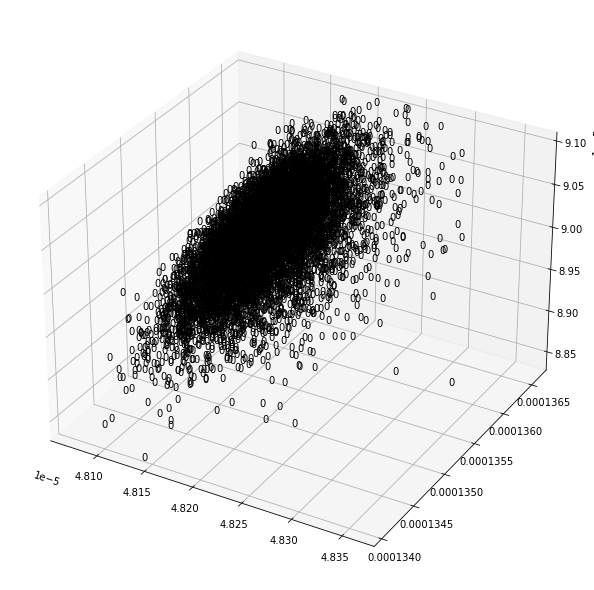

In [20]:
from pylab import rcParams
rcParams['figure.figsize'] = 10, 8

fig = plt.figure(1)
ax = Axes3D(fig)

xs = latent_vector[:, 0]
ys = latent_vector[:, 1]
zs = latent_vector[:, 2]

color=['red','green','blue']

for x, y, z, in zip(xs, ys, zs):
    ax.text(x, y, z, 0)
    
ax.set_xlim(xs.min(), xs.max())
ax.set_ylim(ys.min(), ys.max())
ax.set_zlim(zs.min(), zs.max())

plt.show()